In [1]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

import pandas as pd
import os

#### Load Data

We are going to load in the data that is stored as csv

In [2]:
# List of local file paths
file_paths = [
    "../data/processed/Buffalo_workload.csv",
    "../data/processed/Boston_workload.csv",
    "../data/processed/Miami_workload.csv",
    "../data/processed/Oakland_workload.csv",
    "../data/processed/Washington_workload.csv"
]

# List to store each DataFrame
dataframes = []

# Loop over each file and load into a DataFrame
for file_path in file_paths:
    try:
        # Load the content into a DataFrame
        df = pd.read_csv(file_path)
        
        # Extract city name from the file path
        city_name = file_path.split("/")[-1].split("_")[0].capitalize()  # Capitalize city name

        # Add a new column for the city name
        df["city"] = city_name

        # Append the DataFrame to the list
        dataframes.append(df)
        
    except Exception as e:
        print(f"Failed to process the file '{file_path}': {e}")

# Concatenate all DataFrames into one
merged_df = pd.concat(dataframes)

merged_df['date'] = pd.to_datetime(merged_df['date'])
merged_df.reset_index(drop=True, inplace=True)


# Preview the merged DataFrame
print("Merged DataFrame Preview:")
print(merged_df.head())



Merged DataFrame Preview:
        date                           department  count     city
0 2014-01-02                      Dept of Parking   14.0  Buffalo
1 2014-01-02                 Dept of Public Works  170.0  Buffalo
2 2014-01-02                                 DPIS   29.0  Buffalo
3 2014-01-02                            Utilities   16.0  Buffalo
4 2014-01-02  Buffalo Municipal Housing Authority    2.0  Buffalo


In [3]:
print(len(merged_df.groupby(['city','department'])), "unique combinations of city and department")

110 unique combinations of city and department


### Exploring the seasonality of city level data

At the city level, the magnitude of the seasonality plots is generally less than the magnitude of the trends and residuals plots, indicating that seasonality may not be a big factor.

Miami, Oakland, and Boston all seem to have a constantly increasing number of tickets, which they don't tend to mark closed (this may be a data collection/process issue), so it is not surprising that any seasonal trends are lost in the noise.

Buffalo and Washington show more fluctuation as they open and close tickets, and the magnitude of Buffalo's seasonality is closer to that of the trends and residuals.

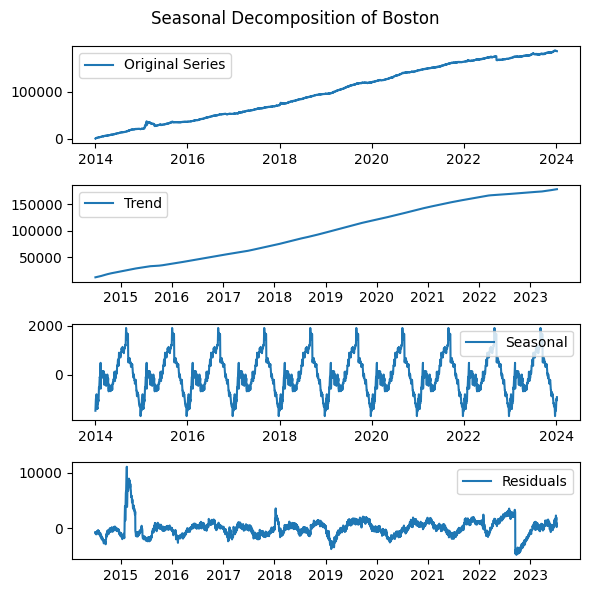

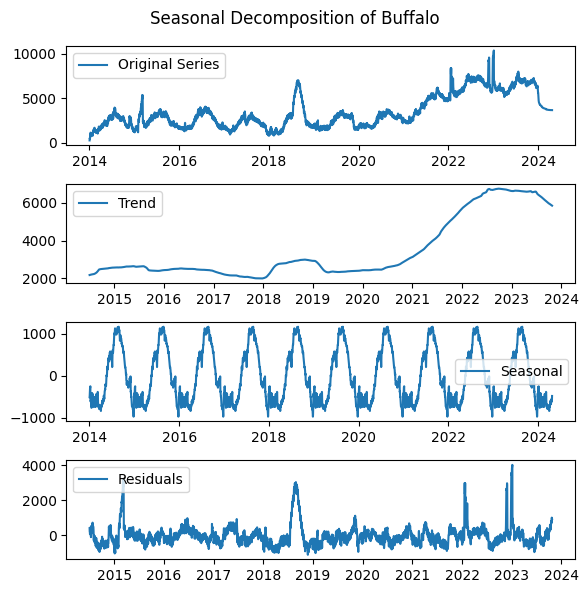

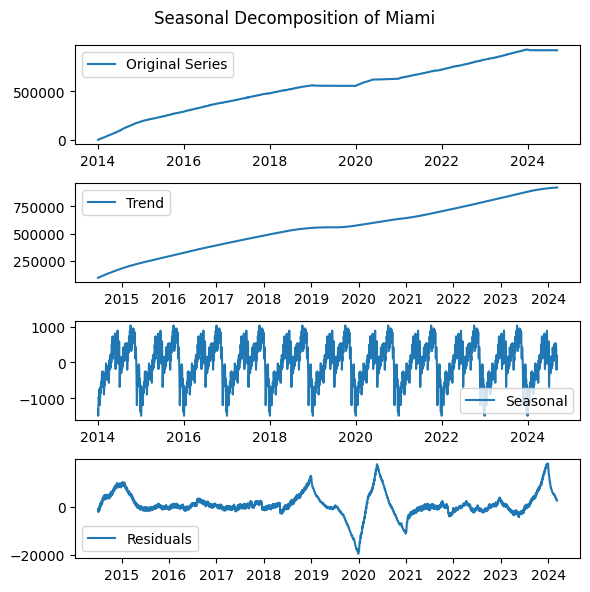

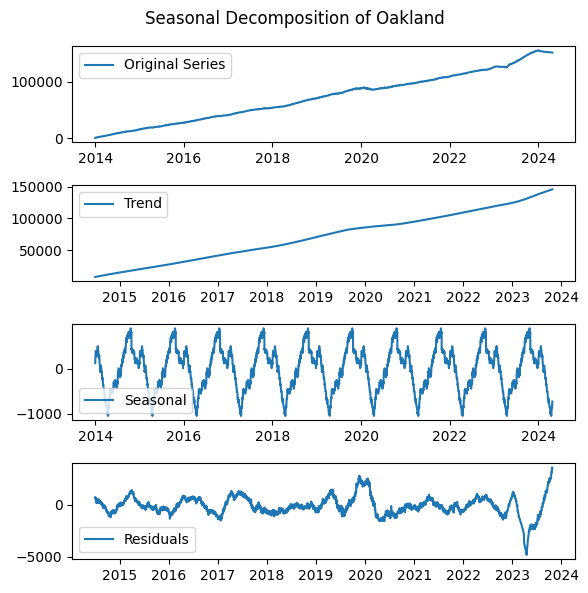

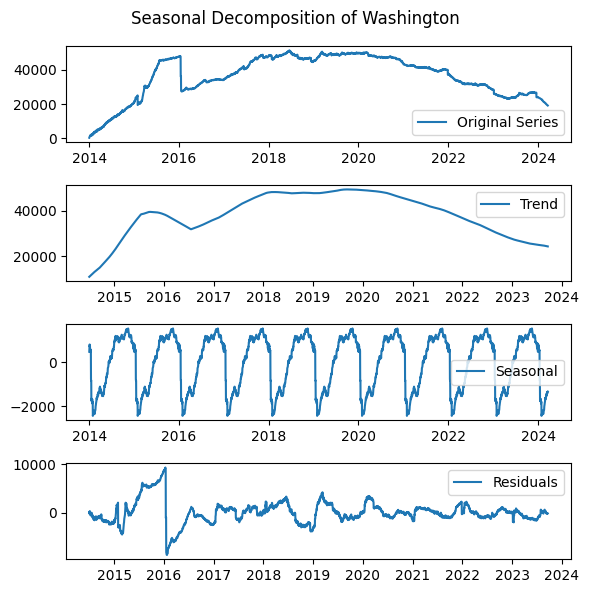

In [4]:
for city, city_df in merged_df.groupby("city"):
    # Perform seasonal decomposition on city level summary data
    df = city_df.groupby("date")["count"].sum().reset_index().set_index('date')
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {city}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


### Buffalo Seasonality Plots by Department

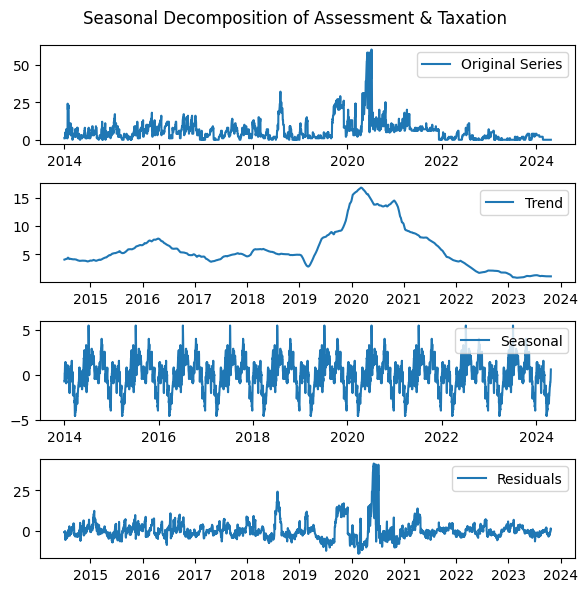

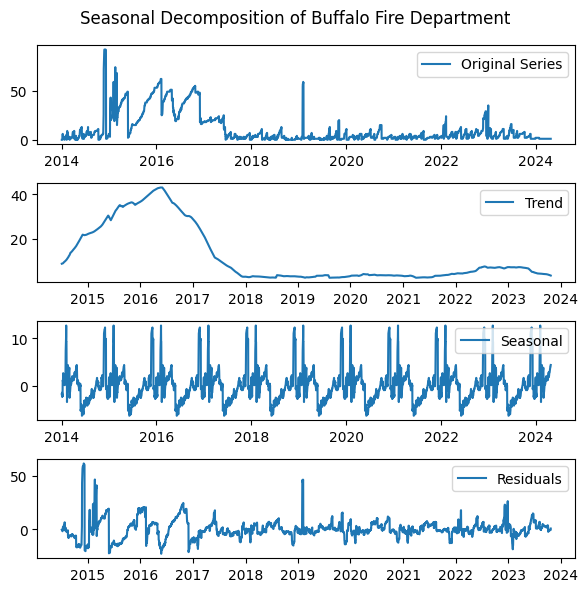

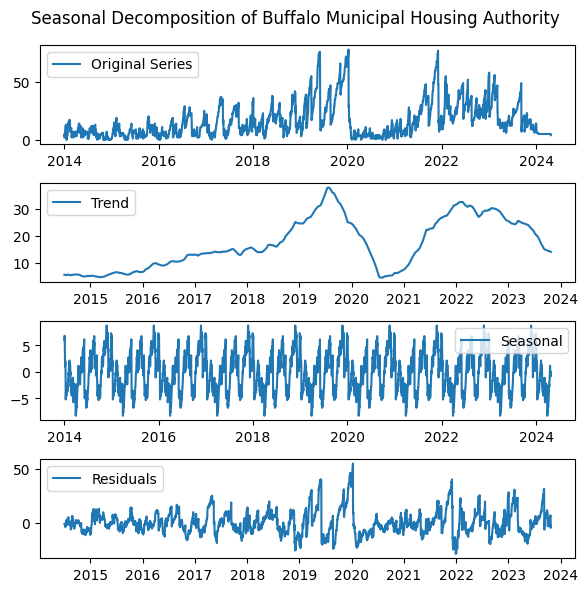

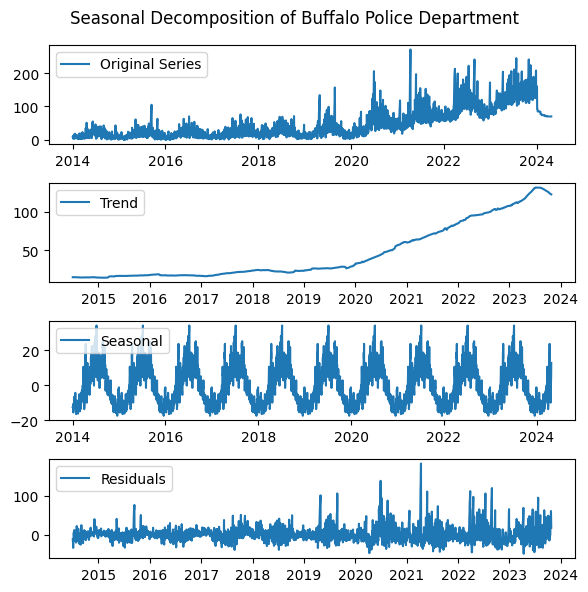

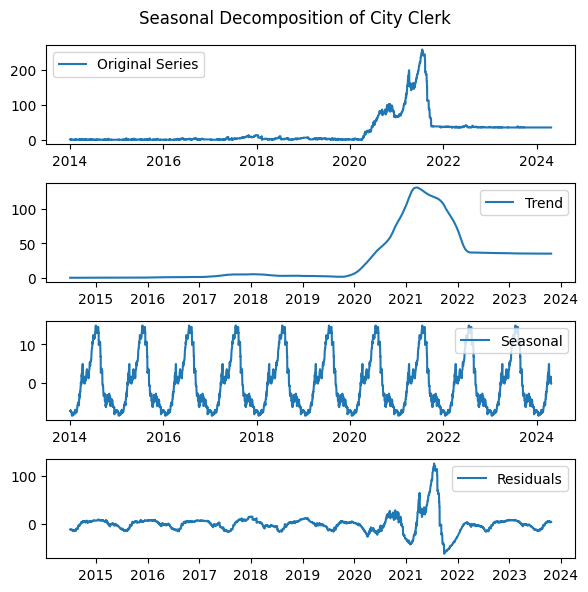

...

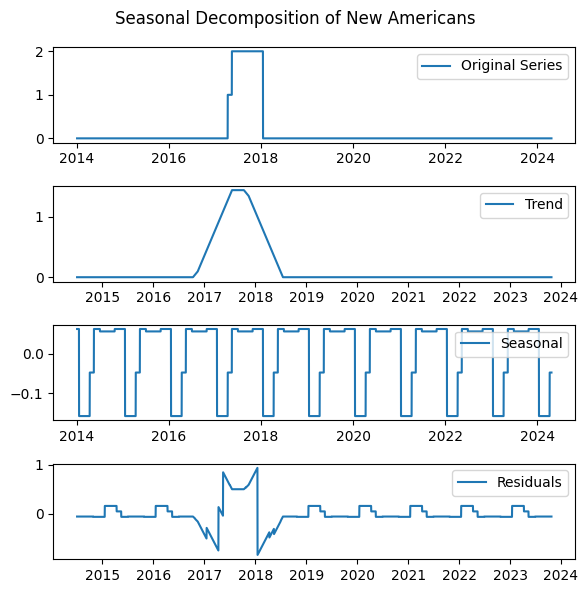

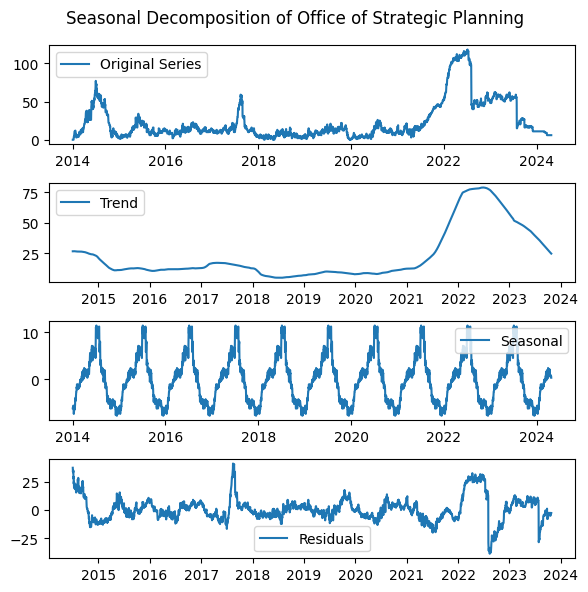

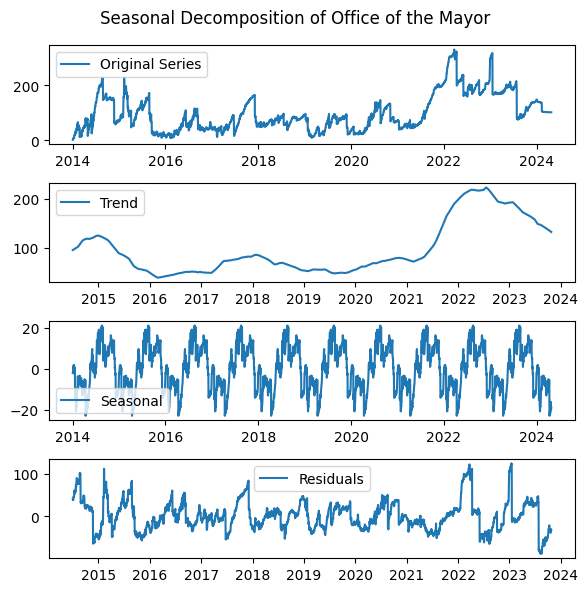

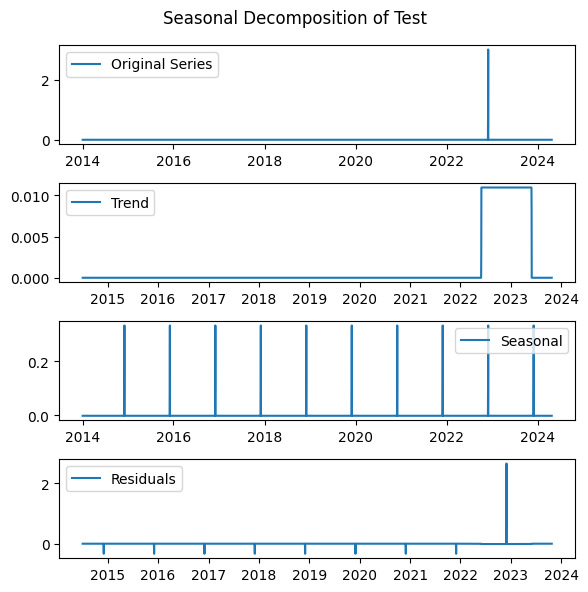

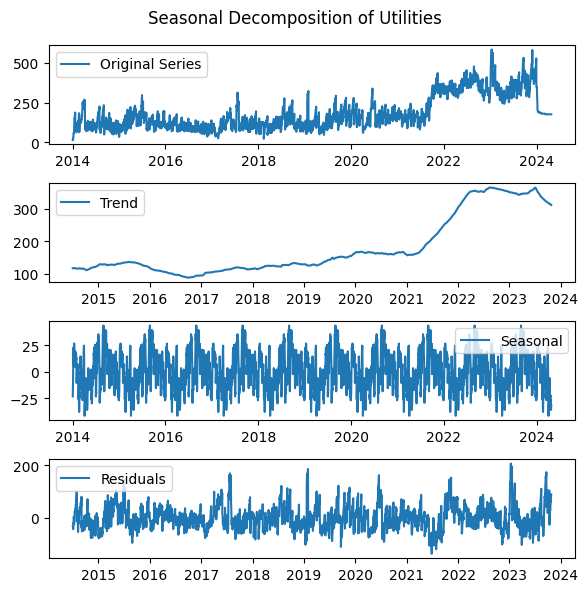

In [5]:
buffalo = merged_df[merged_df['city'] == 'Buffalo']
for dept, df in buffalo.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    df.set_index('date', inplace=True)
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


#### Determining which departments to drop

In [6]:
buffalo.groupby('department')['count'].median().sort_values()

department
Community Services & Rec. Program.        0.0
Test                                      0.0
New Americans                             0.0
Human Resources                           0.0
Management Information Systems            0.0
Assessment & Taxation                     4.0
Buffalo Fire Department                   4.0
City Clerk                                4.0
Dept of Law                              10.0
Buffalo Municipal Housing Authority      12.0
Office of Strategic Planning             12.0
Buffalo Police Department                28.0
Dept of Parking                          44.0
Office of the Mayor                      79.5
Utilities                               145.0
DPIS                                    639.0
Dept of Public Works                   1759.0
Name: count, dtype: float64

Dropping those with very few and infrequent requests.

In [7]:
drop_depts = ['Human Resources','Test','New Americans', 'Management Information Systems','Community Services & Rec. Program.']

merged_df.drop(merged_df.index[(merged_df['city']=='Buffalo')&(merged_df['department'].isin(drop_depts))],inplace=True)

#### Miami Seasonality Plots by department

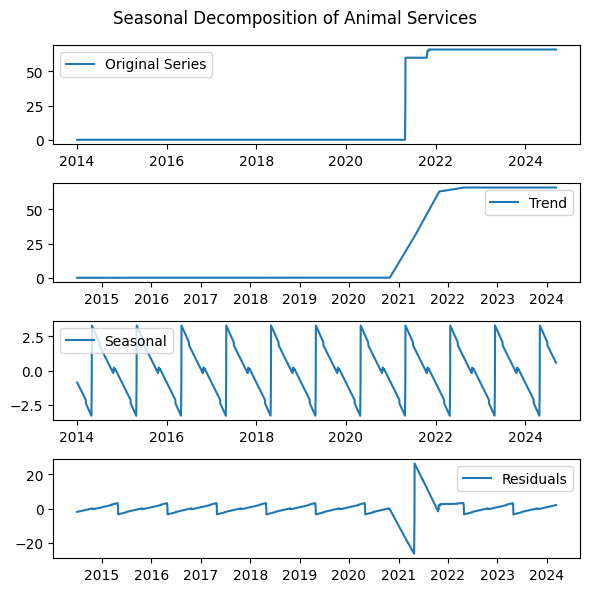

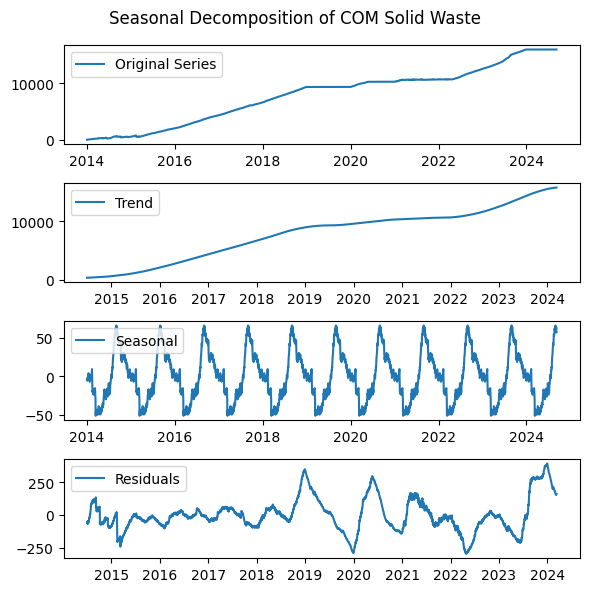

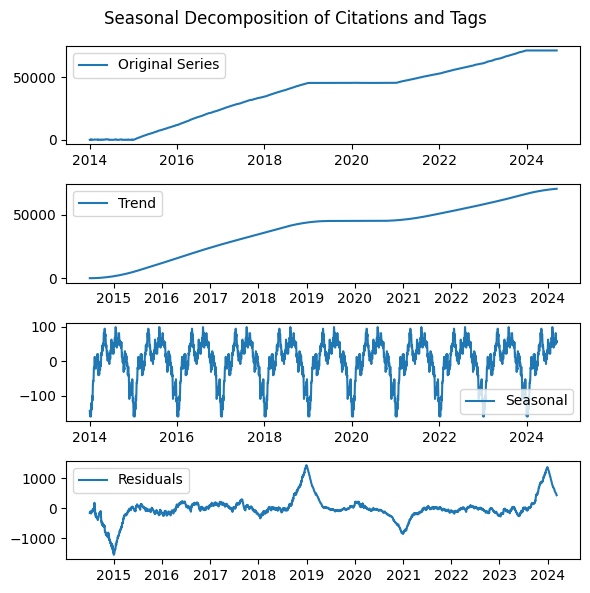

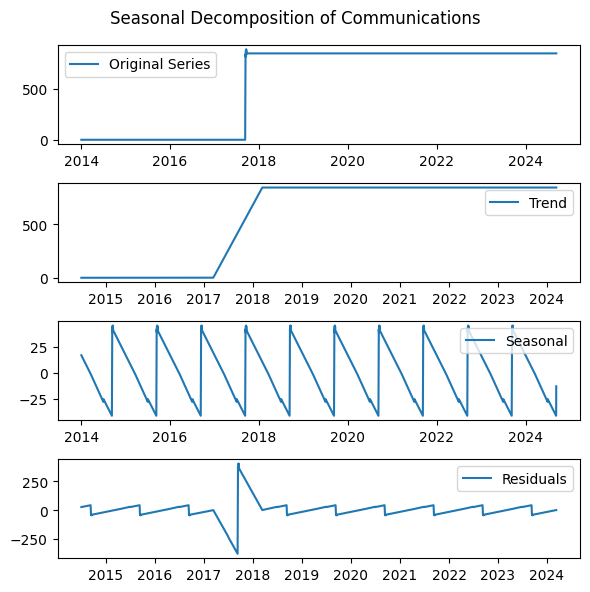

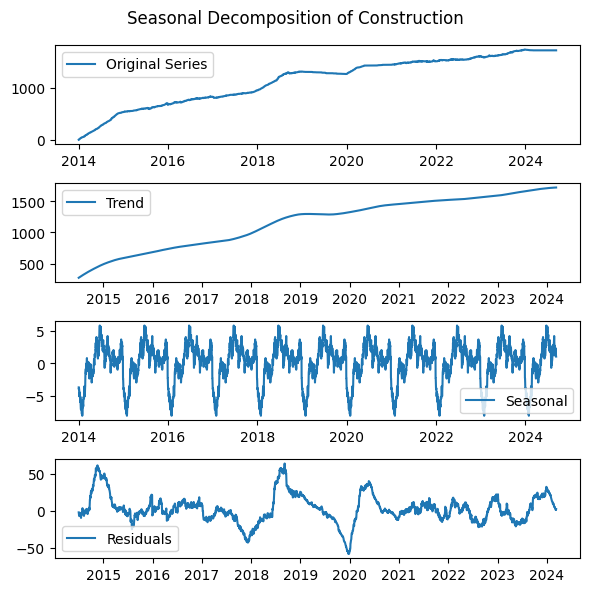

...

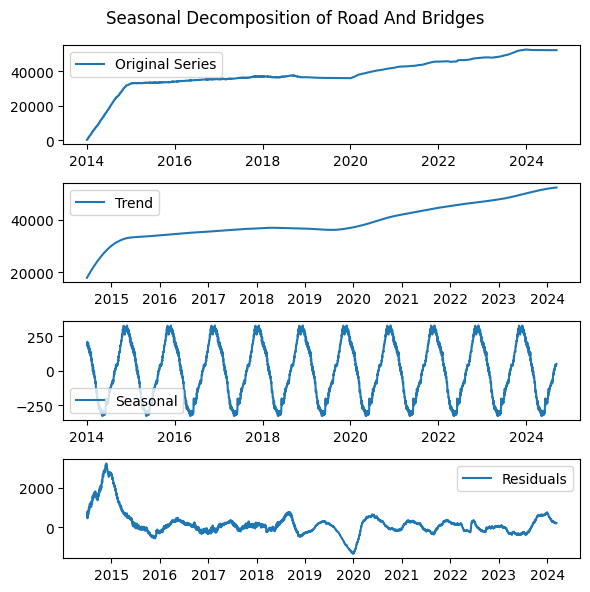

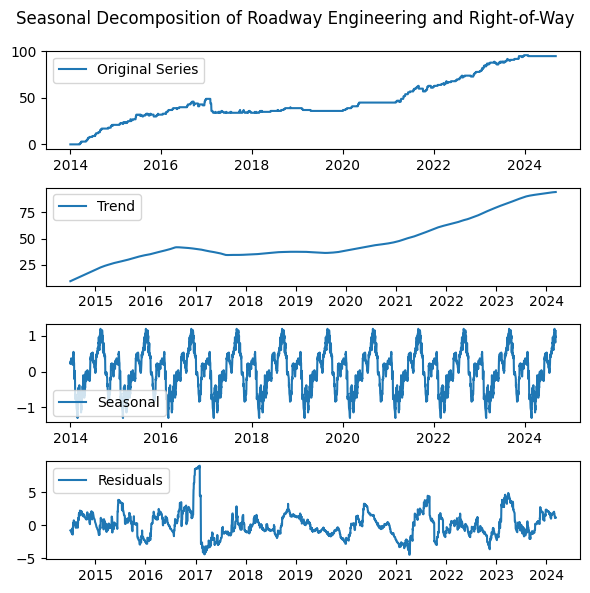

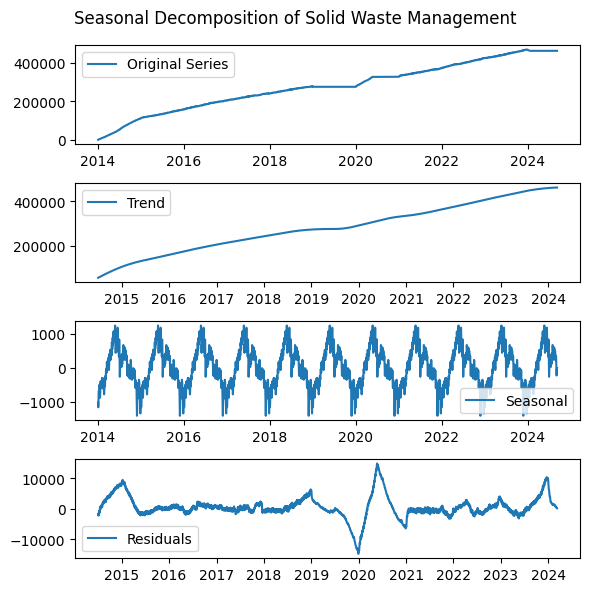

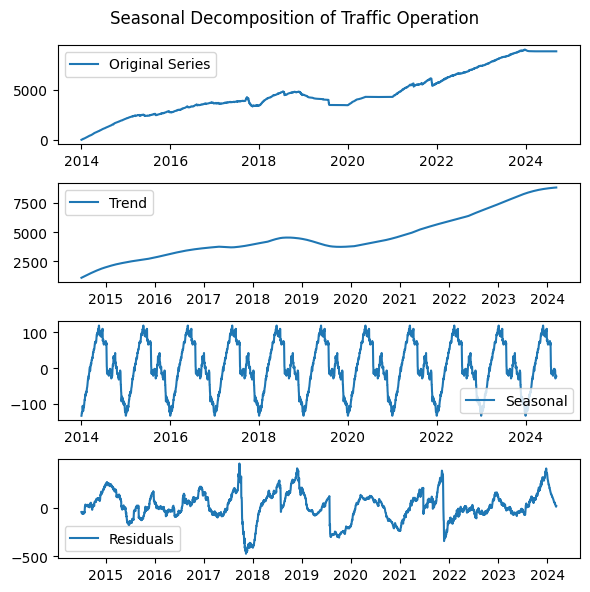

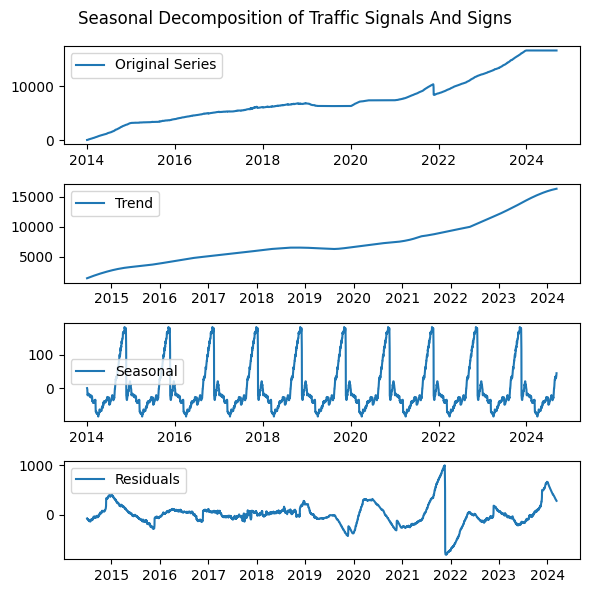

In [8]:
mia = merged_df[merged_df['city'] == 'Miami']
for dept, df in mia.groupby("department"):
    df.set_index('date', inplace=True)
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

#### Determining which departments to drop

In [9]:
mia.groupby('department')['count'].median().sort_values()

department
Animal Services                              0.0
Roadway Engineering and Right-of-Way        39.0
Communications                             846.0
Construction                              1290.0
Traffic Operation                         4186.0
Traffic Signals And Signs                 6464.0
COM Solid Waste                           9321.0
RAAM                                     23922.0
Road And Bridges                         36754.0
Regulatory and Economic Resources        39751.0
Citations and Tags                       45300.0
Enforcement Section                     118417.0
Solid Waste Management                  274922.0
Name: count, dtype: float64

Dropping those with very few or infrequent requests, and also communications, which appears to have been all dumped into the system at once.

In [10]:
drop_depts = ['Communications','Roadway Engineering and Right-of-Way','Animal Services']
merged_df = merged_df.drop(merged_df.index[(merged_df['city']=='Miami')&(merged_df['department'].isin(drop_depts))])

### Boston Seasonality Plots by Department

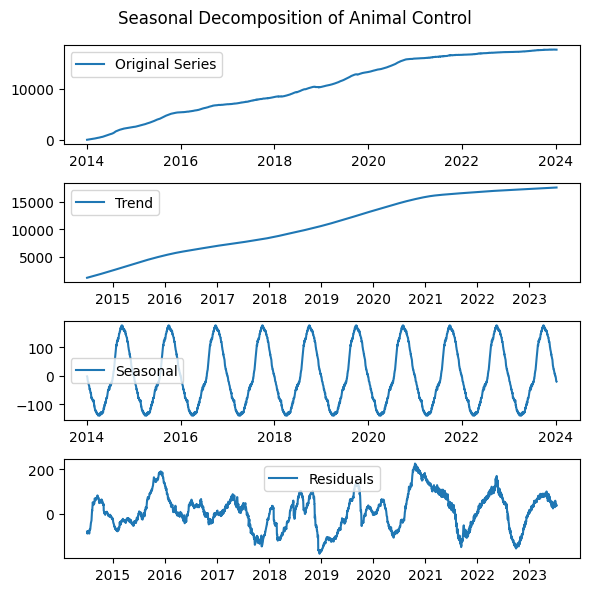

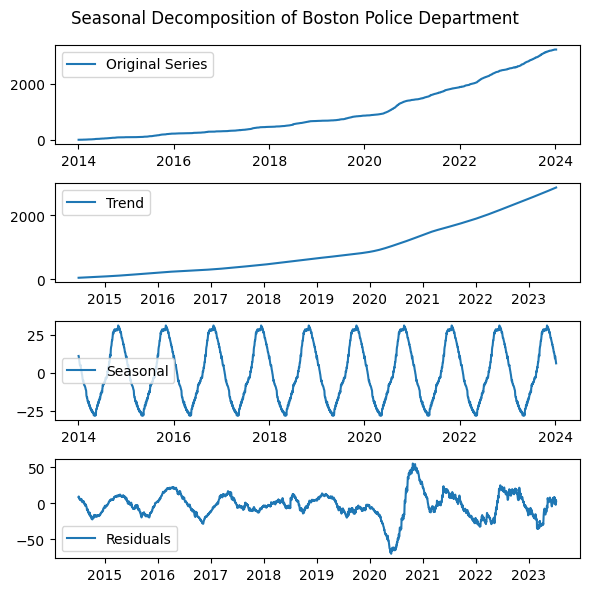

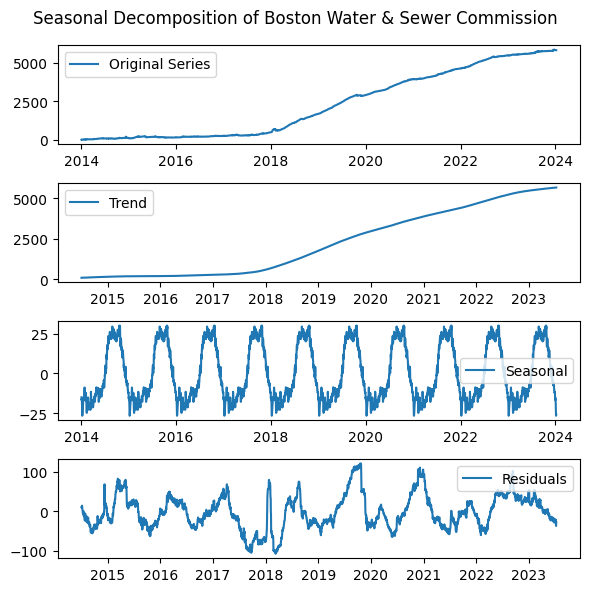

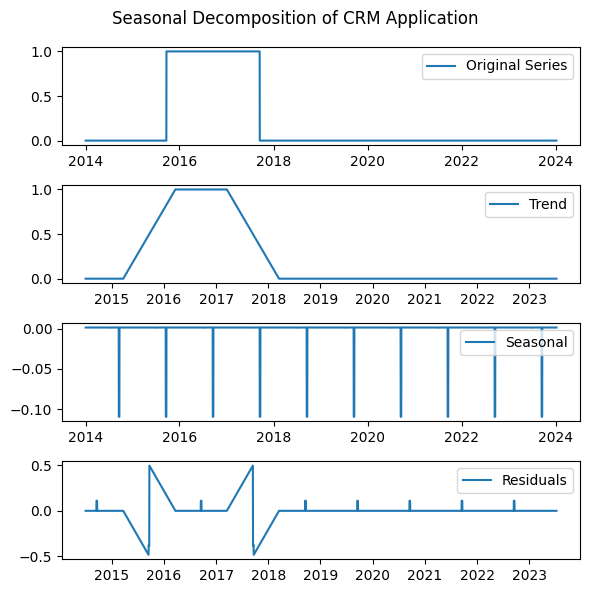

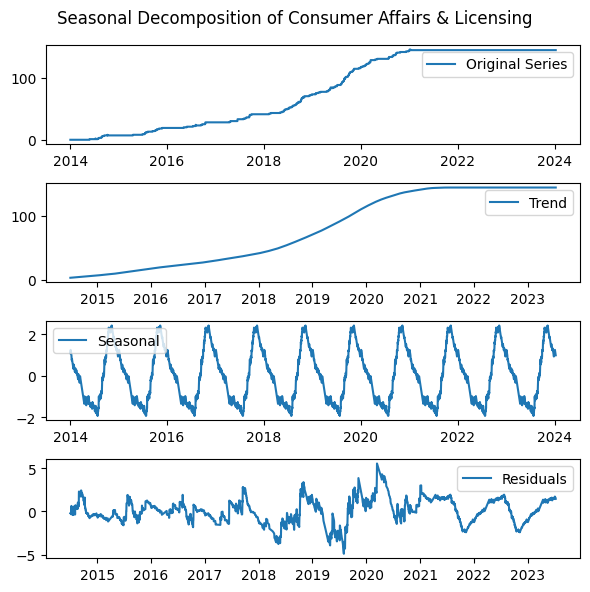

...

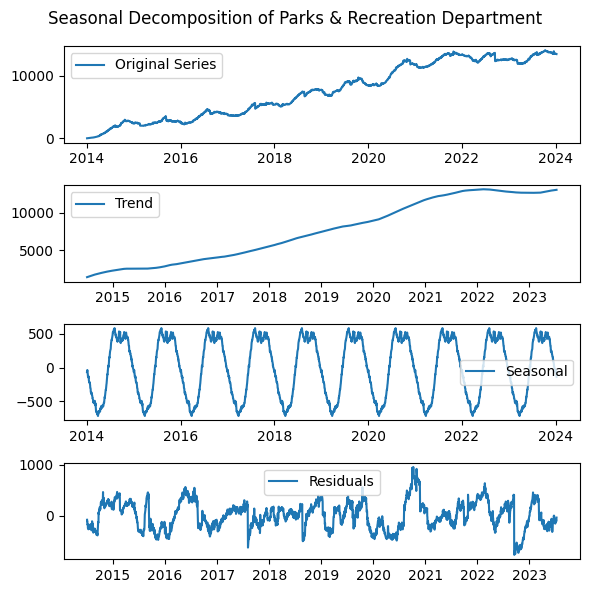

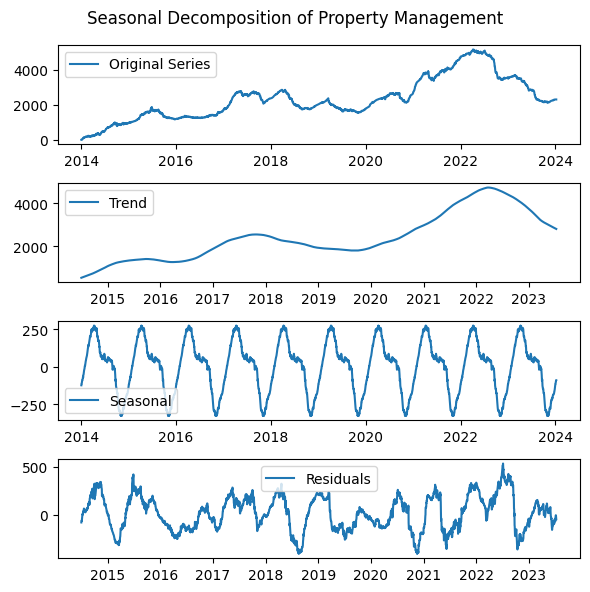

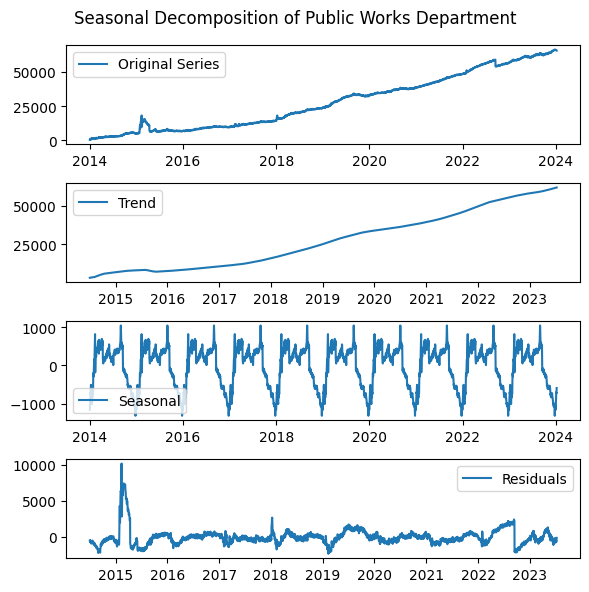

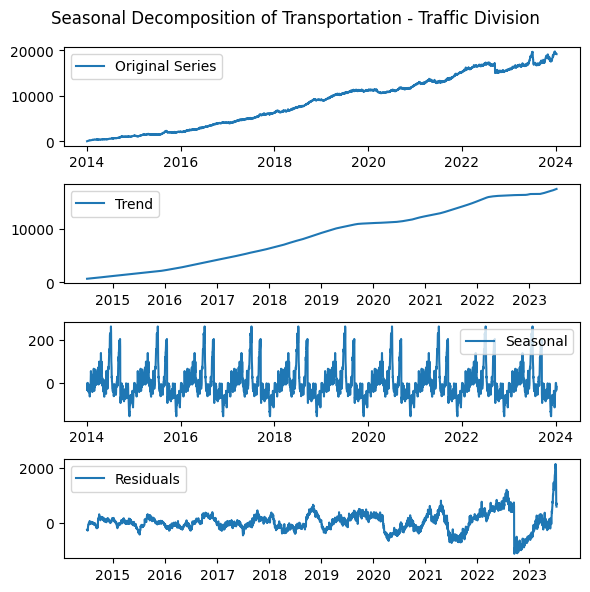

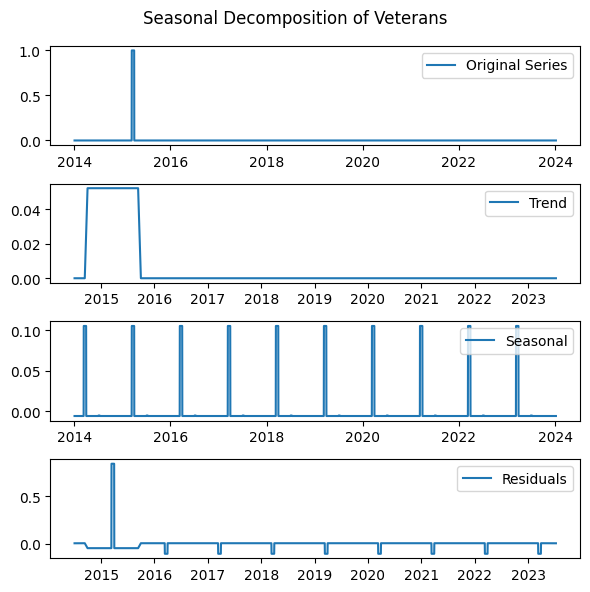

In [11]:
bos = merged_df[merged_df['city'] == 'Boston']
for dept, df in bos.groupby("department"):
    df.set_index('date', inplace=True)
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

#### Determining which departments to drop

In [12]:
bos.groupby('department')['count'].median().sort_values()

department
CRM Application                          0.0
Disability Department                    0.0
Veterans                                 0.0
Consumer Affairs & Licensing            73.0
Neighborhood Services                   81.0
Boston Police Department               670.0
Boston Water & Sewer Commission       1702.0
Property Management                   2166.0
Parks & Recreation Department         7457.0
Transportation - Traffic Division     9152.0
Animal Control                       10439.0
Mayor's 24 Hour Hotline              11078.0
Public Works Department              23726.0
Inspectional Services                28960.0
Name: count, dtype: float64

Dropping those with very few or infrequent requests, and disability department which hasn't been used in years. Consumer Affairs and licensing does not appear to have any recent new requests and has remained static.

In [13]:
drop_depts = ['Disability Department','Neighborhood Services','Consumer Affairs & Licensing','Veterans','CRM Application']

merged_df = merged_df.drop(merged_df.index[(merged_df['city']=='Boston')&(merged_df['department'].isin(drop_depts))])

### Oakland Seasonality plots by department

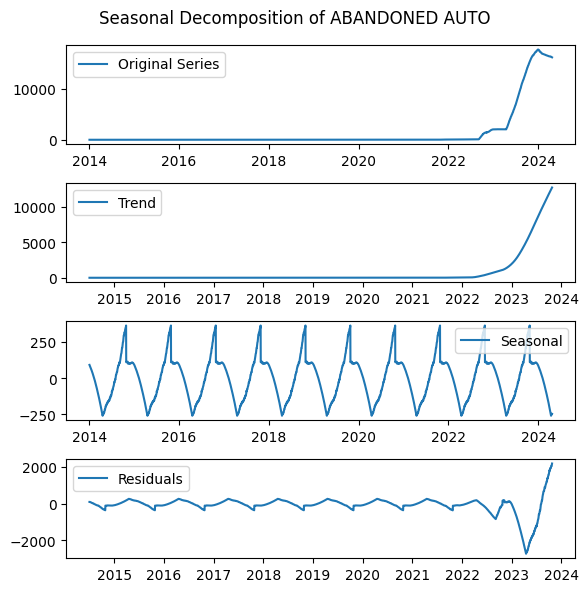

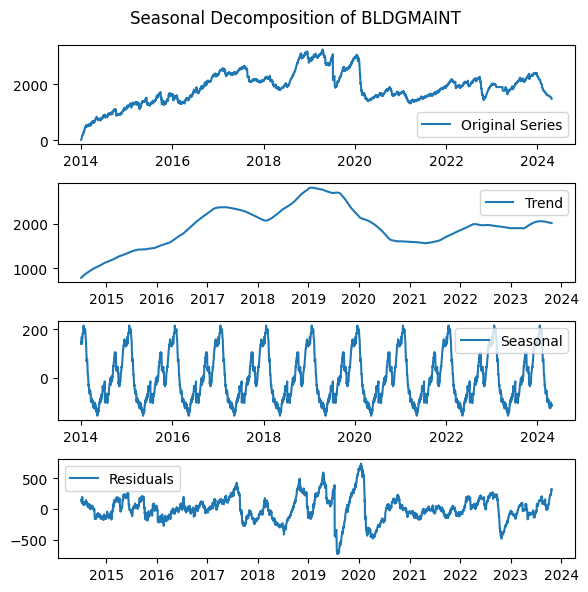

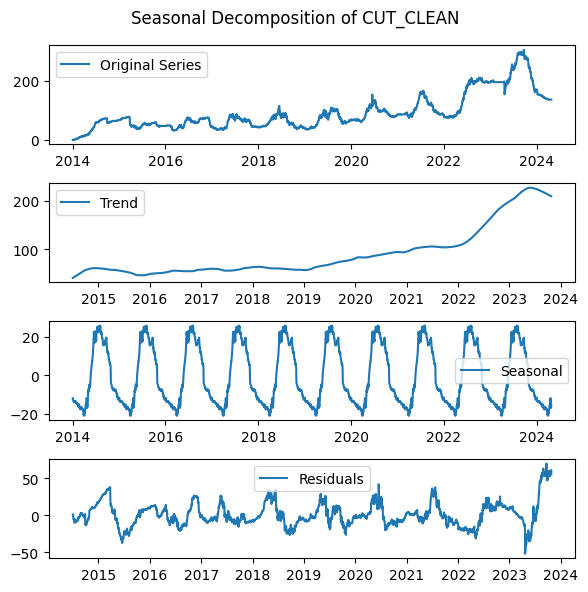

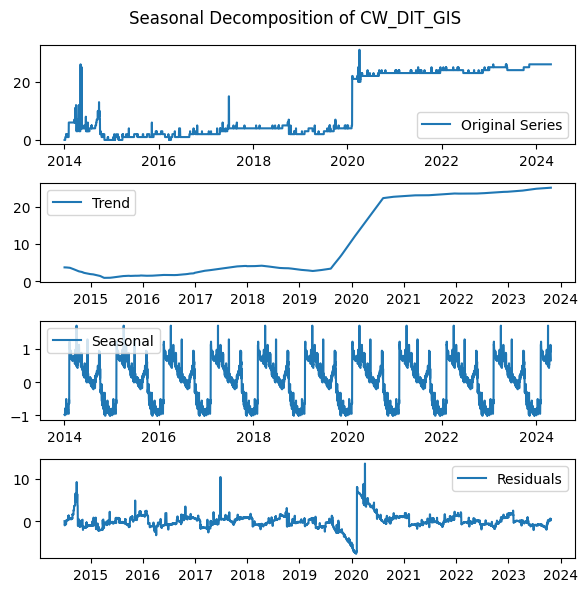

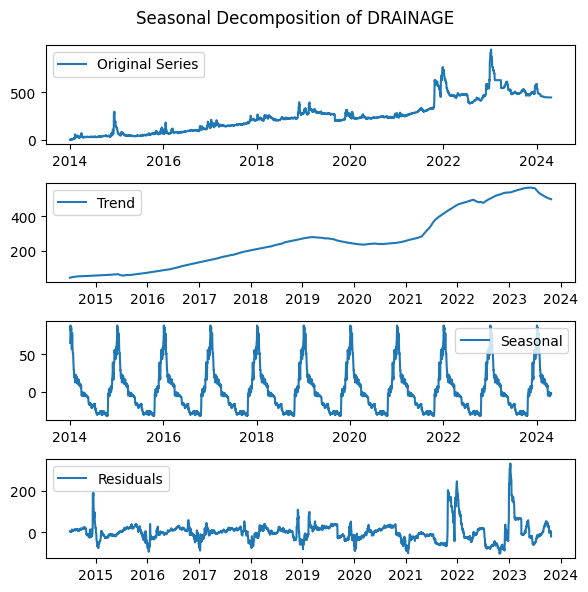

...

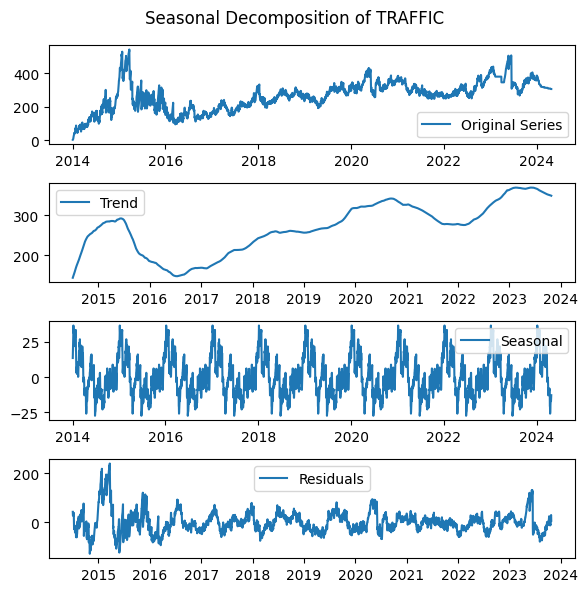

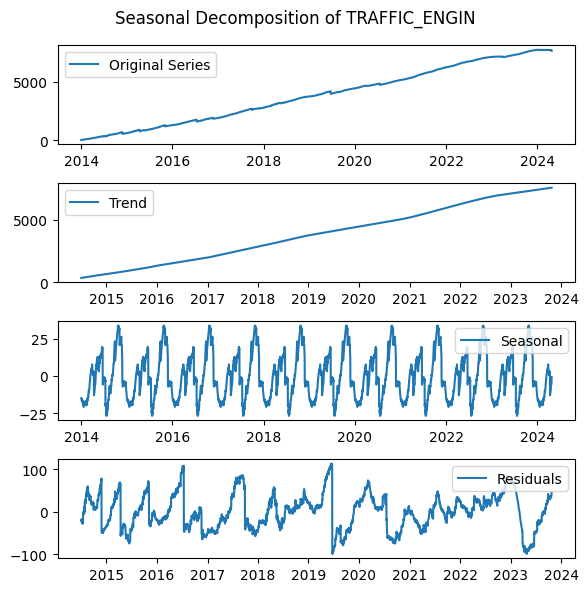

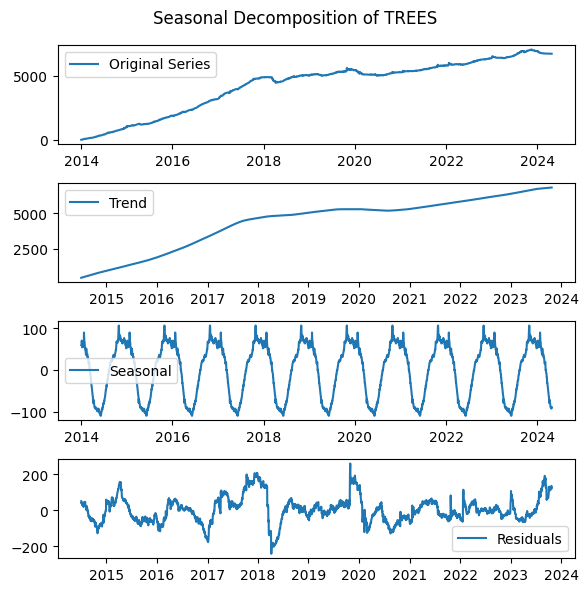

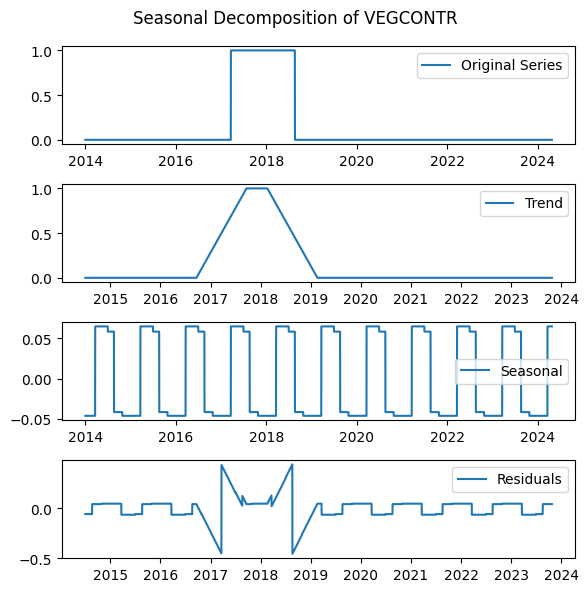

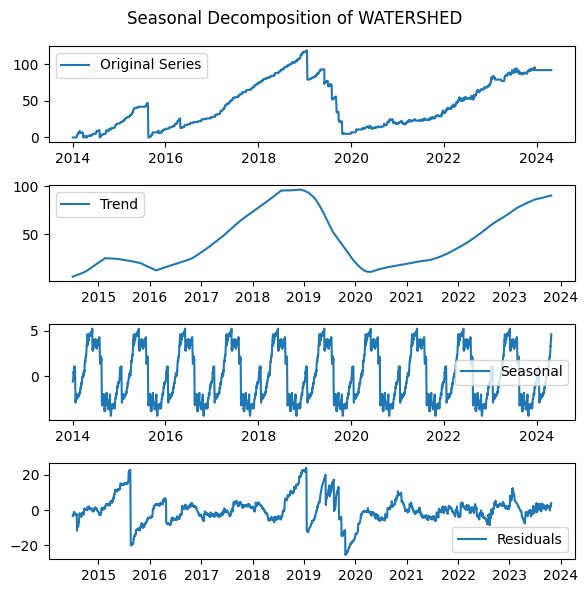

In [14]:
oak = merged_df[merged_df['city'] == 'Oakland']
for dept, df in oak.groupby("department"):
    df.set_index('date', inplace=True)
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

#### Determining which departments to drop

In [15]:
oak.groupby('department')['count'].median().sort_values()

department
ABANDONED AUTO        0.0
SIDESHOWS             0.0
VEGCONTR              0.0
LAB                   0.0
ENVIRON_ENF           0.0
FACILITIES            0.0
SURVEY                1.0
CW_DIT_GIS            4.0
HE_CLEAN             16.0
WATERSHED            35.0
RECYCLING            49.0
KOCB                 62.0
HOMELESS EMT         64.0
CUT_CLEAN            74.0
SEWERS               91.0
DRAINAGE            232.0
TRAFFIC             270.0
PARKS               316.0
ELECTRICAL          317.0
GRAFFITI            608.5
FIRE                652.5
ILLDUMP             690.0
POLICE              891.0
METER_REPAIR        929.0
BLDGMAINT          1872.0
PARKING            2364.5
ROW_INSPECTORS     2855.0
ROW                3406.0
TRAFFIC_ENGIN      3855.5
TREES              5060.0
STREETSW           8623.0
OTHER             38949.0
Name: count, dtype: float64

Dropping those with few, infrequent, or only too recent requuests (not much history)

In [16]:
drop_depts = ['ABANDONED AUTO','SIDESHOWS','VEGCONTR','FACILITIES','LAB','SURVEY']

merged_df = merged_df.drop(merged_df.index[(merged_df['city']=='Oakland')&(merged_df['department'].isin(drop_depts))])

### Washington Seasonality Plots by Department


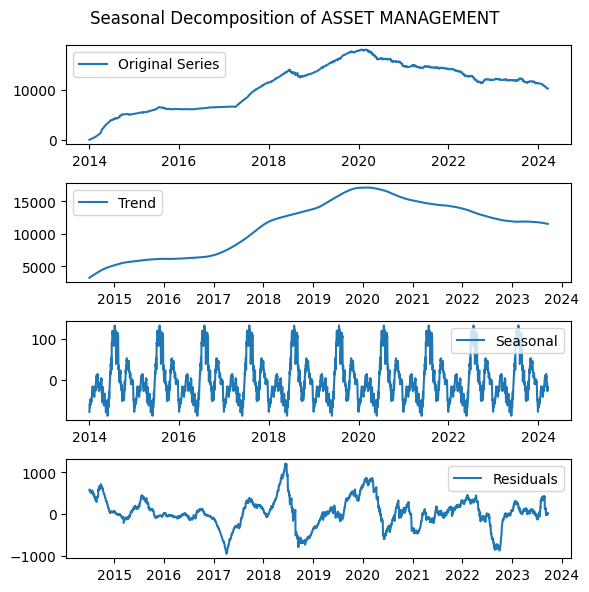

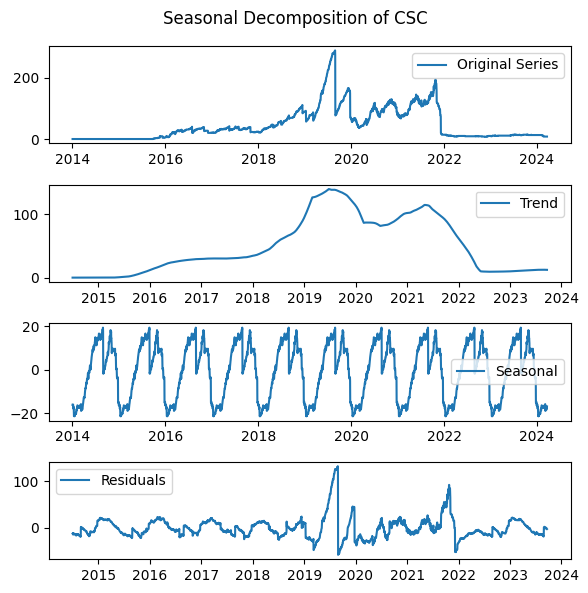

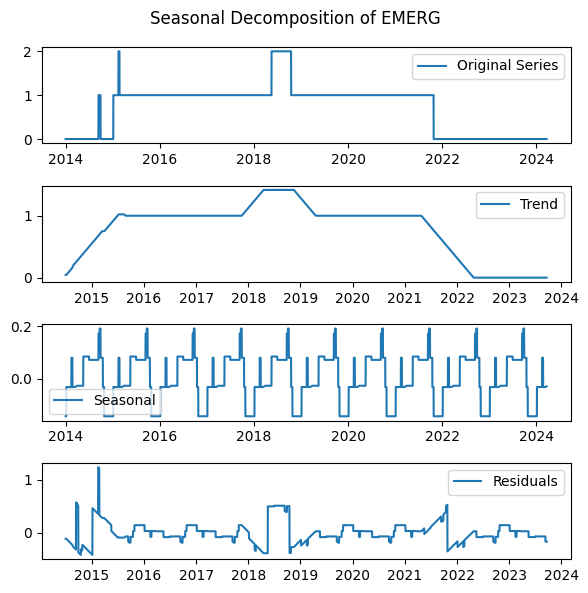

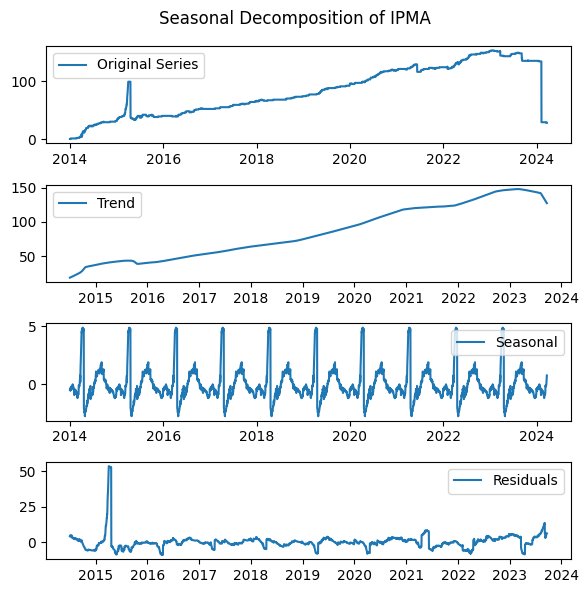

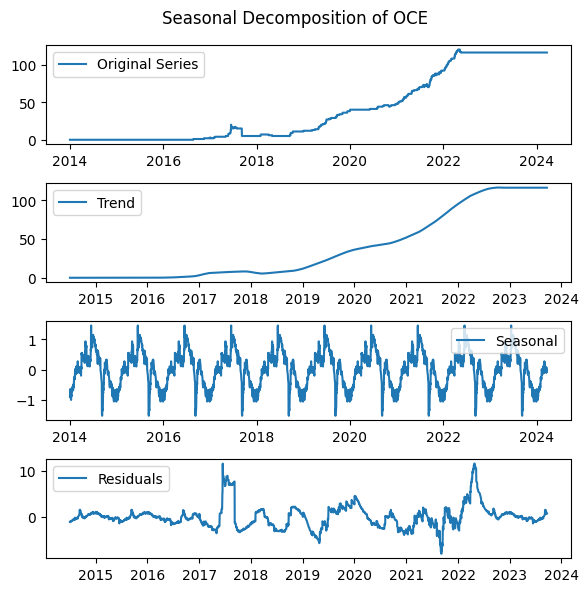

...

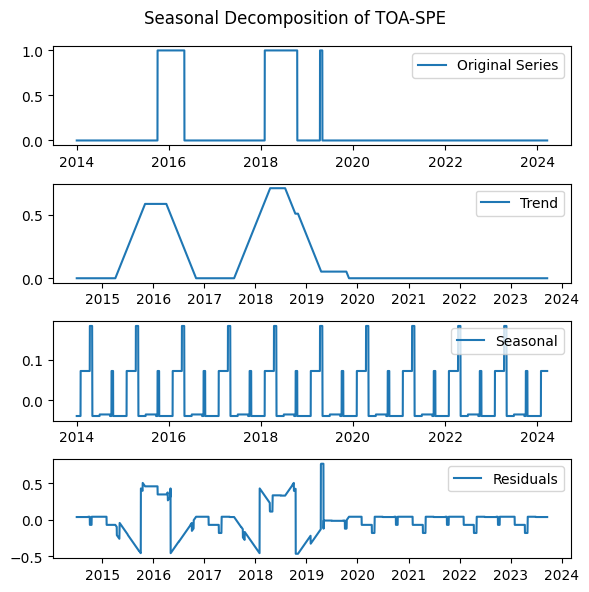

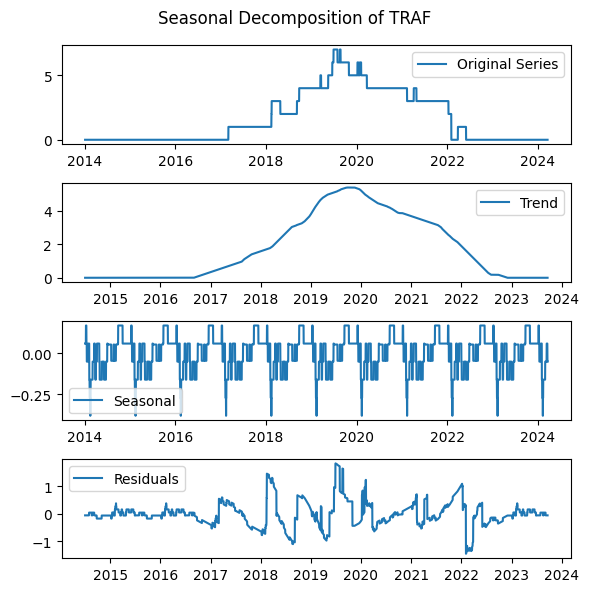

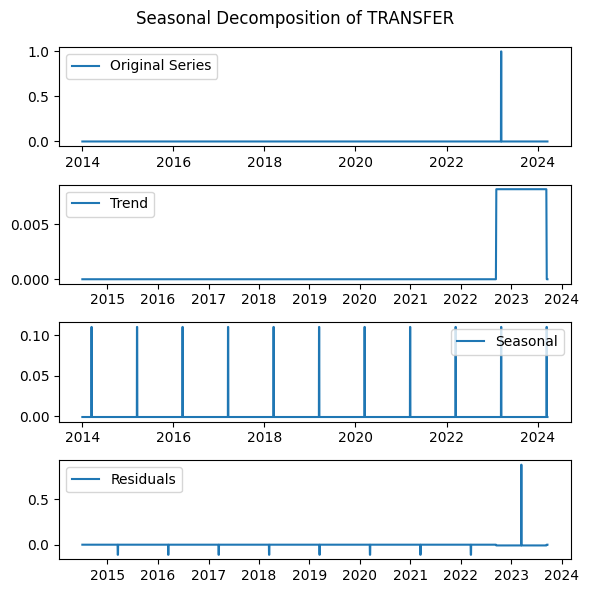

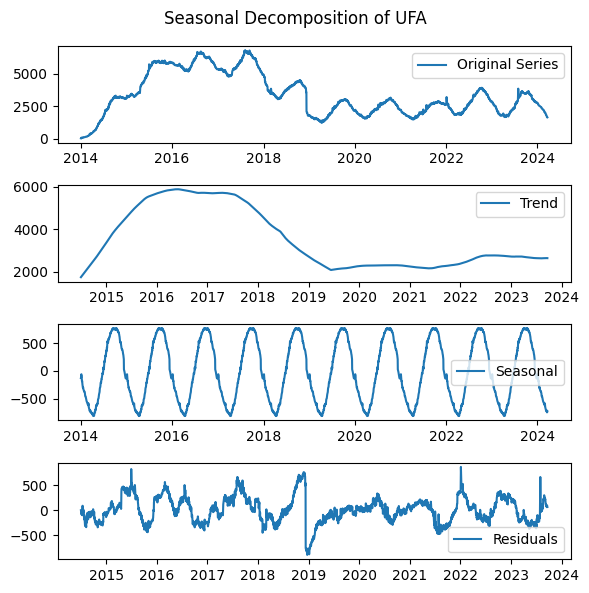

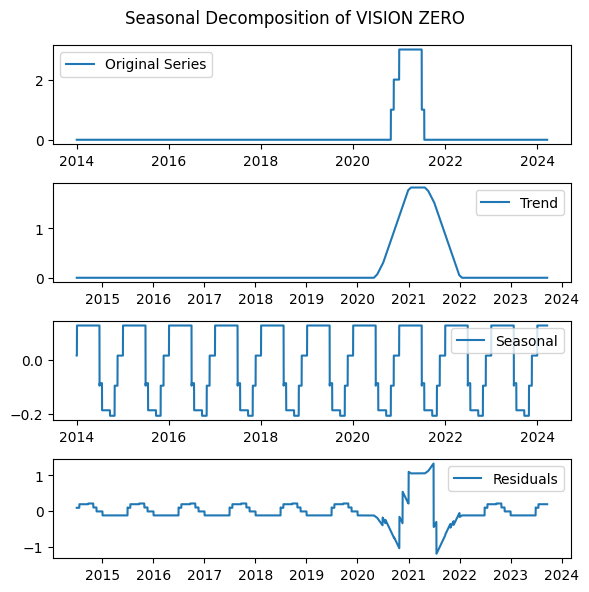

In [17]:
dc = merged_df[merged_df['city'] == 'Washington']
for dept, df in dc.groupby("department"):
    df.set_index('date', inplace=True)
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


In [18]:
dc.groupby('department')['count'].median().sort_values()

department
VISION ZERO                                   0.0
TOA-SPE                                       0.0
TOA-S                                         0.0
TOA-OOD                                       0.0
TRAF                                          0.0
TRANSFER                                      0.0
PSMA                                          0.0
PSRA                                          0.0
EMERG                                         1.0
PD                                            1.0
TOA-ITS                                       1.0
PUBLIC SPACE REGULATION ADMINISTRATION        2.0
POTHOLES                                      2.0
TCO                                           5.0
PUBLIC SPACE INSPECTIONS                      6.0
STREETCAR                                    11.0
TOA-SIGNALS                                  12.0
OCE                                          15.0
CSC                                          26.0
PTSA                                   

In [19]:
drop_depts = ['VISION ZERO','TOA-SPE','TOA-S','TOA-OOD','TRANSFER','PSRA','PSMA','EMERG','PUBLIC SPACE REGULATION ADMINISTRATION','STREETCAR','TOA-ITS','TOA-SIGNALS','TRAF']

merged_df = merged_df.drop(merged_df.index[(merged_df['city']=='Washington')&(merged_df['department'].isin(drop_depts))])

### Conclusion

In [20]:
print(len(merged_df.groupby(['city','department'])), "unique combinations of city and department")

78 unique combinations of city and department


In [21]:
merged_df.to_csv("../data/out/merged_data.csv", index=False)